In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import osmnx as ox
import pyproj
import geopy.distance
import math

In [2]:

# Define the function for localized nodes: 

def get_node( x , y ): 
    '''
    -----------------------------------------------------------------------------------------
    Input: X and Y are values of latituted and atitudes of the nudes
    Output: Plot of the map of the 400m around the given coordinates and mutltiarray of nodes
    -----------------------------------------------------------------------------------------
    '''
    # Gettin the nodes we have: 

    # Node to get 
    Node_1 = ox.project_graph(ox.graph_from_point((x, y), dist=200, network_type='drive'))
    Node_1p = ox.consolidate_intersections(Node_1, tolerance=10, rebuild_graph=True, dead_ends=True)

    #Plot with names :
    fig, ax = ox.plot_graph(Node_1p, bgcolor='k', edge_linewidth=3, node_size=0,
                        show=False, close=False)
    for _, edge in ox.graph_to_gdfs(Node_1p, nodes=False).fillna('').iterrows():
        c = edge['geometry'].centroid
        text = edge['name']
        ax.annotate(text, (c.x, c.y), c='w')
    plt.show()
    
    return Node_1p

#+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Define function to convert to data frame: 

def convert_df( Node_1p , name_of_street):
    '''
    -----------------------------------------------------------------------------------------
    Input:  Multiarray of nodes and string of street we want 
    Output: Data frame of the given nodes and filtered by name of streets
    -----------------------------------------------------------------------------------------
    '''
    # Convert into data frame: 
    data3 = nx.to_pandas_edgelist(Node_1p)
    
    # Fileterinf the data: 
    filtered_data3_name = data3.loc[data3['name'] == name_of_street]
    
    return filtered_data3_name
    
#+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Defining function to plot the node in the selected 400 aorund : 

def zoomed_node ( Node2 , x ) :
    '''
    -----------------------------------------------------------------------------------------
    Input:  The multiarray of the 400 around the nodes and the source node 
    Output: Plot of just the node over the streets
    -----------------------------------------------------------------------------------------
    '''
    # Plottign the node 1: 
    route0 = nx.shortest_path(Node2, x, x)

    #Plot routes: 
    fig, ax = ox.plot_graph_route(Node2, route0, route_linewidth=6, node_size=0)
    
#+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Defining function to get the value of the node 'source': 

def get_real_node( df , u_original ):
    '''
    -----------------------------------------------------------------------------------------
    Input:  DataFrame contining the info of the node  and the osmid in df
    Output: the real value of the node in the array of the whole map
    -----------------------------------------------------------------------------------------
    '''
    #filtering data by the osmid
    filtered_data0_name = df.loc[df['u_original'] == u_original]
    
    # getting the real number of the node 
    source = np.array(filtered_data0_name['source'])
    
    return source[0]
#+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Dictionary to save tha values of the nodes in the map: 
nodes_id = {}

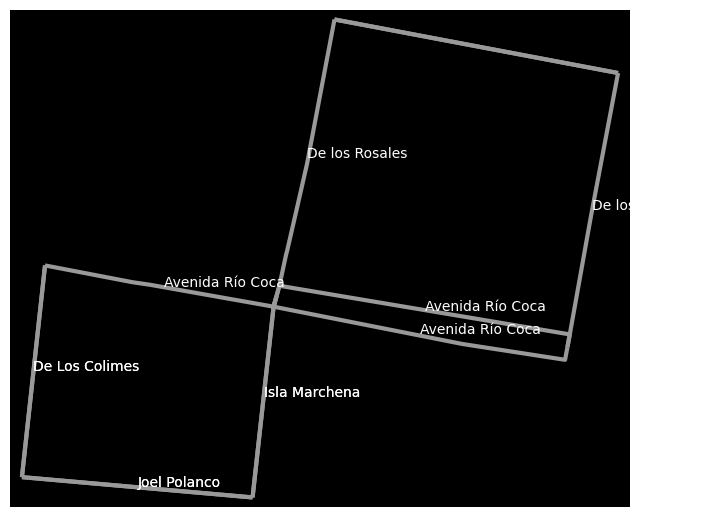

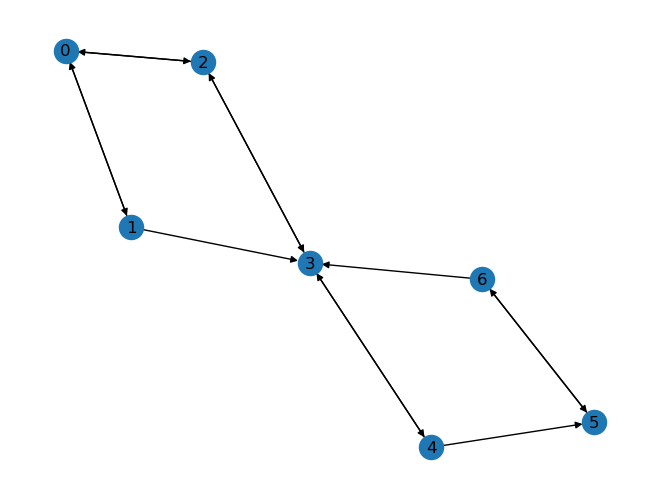

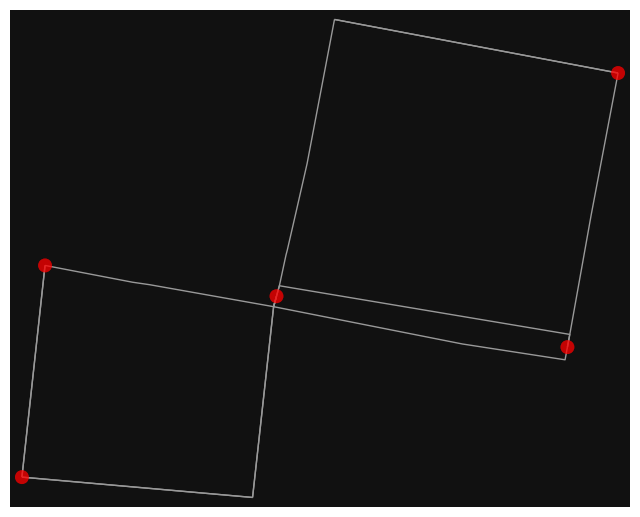

In [3]:
# get node
G = get_node(-0.1641, -78.47168)

# plot the netwrok
nx.draw(G, with_labels=True)

# convert to data frame
data = nx.to_pandas_edgelist(G)

# converto to network
H=nx.from_pandas_edgelist(data)

# Plottign the node 1: 
route0 = nx.shortest_path(G, 0, 0)
route2 = nx.shortest_path(G, 1, 1)
route3 = nx.shortest_path(G, 3, 3)
route4 = nx.shortest_path(G, 4, 4)
route1 = nx.shortest_path(G, 5, 5)
routes = [route0 , route1 ,route2, route3 ,route4]

#Plot routes: 
fig, ax = ox.plot_graph_routes(G, routes, route_linewidth=6, node_size=0)

In [4]:
# define function to get the feocoordinates of the node 

def get_geo_coordinates (graph):
    """ Fnction to find coordineste latitude and longitude of the node using the cartesian coordintes """

    nodes = graph.nodes
    # dicitinary to store the coordinates of each node 
    coordinates = {}

    for i in range(0,len(nodes)):
        x, y  = nodes[i]['x'] , nodes[i]['y'] 
        projection = pyproj.Transformer.from_crs("EPSG:32617", "EPSG:4326", always_xy=True)

        # Convert Cartesian coordinates to latitude and longitude
        lon , lat  = projection.transform(x, y)
        # tuple
        a =  lat, lon  
    
        coordinates[i] = a 
        
    return coordinates

In [5]:
# function that calcualtes the angle bewteen the node and north pole 

def get_angle( source , target ): 
    """
    clacualtes the bearing bewteen geodesic that pass through nodes and north pole 
    """
    angle = ox.bearing.calculate_bearing(source[0],source[1] , target[0],target[1] )

    return angle

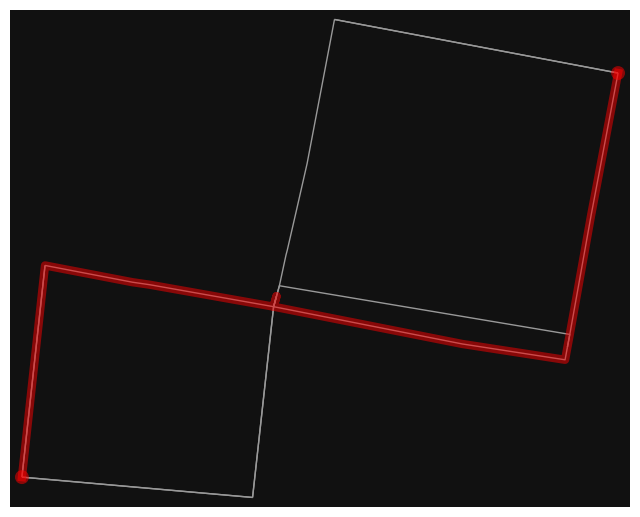

In [6]:
route0 = nx.shortest_path(G, 0, 5)

#Plot routes: 
fig, ax = ox.plot_graph_route(G, route0, route_linewidth=6, node_size=0)

In [7]:
# getting disntance  in km between two nodes
def get_distance(source , target): 

    """ Funtion that retunrs the distance in km between the node_i and the destination node """

    distance = geopy.distance.geodesic(source, target).km
    
    return distance

In [8]:
# define probability function 

def get_factor (dist_i, angle_i, dist_0 , angle_0):
    """ the facotr function for the ABM """

    # weight of distance anf angle deviation 
    # W_d = 0.7 
    # W_a = 0.3
    W_d = 0.6 
    W_a = 0.4

    # normalized units 
    norm_dis = dist_i / dist_0
    norm_angle = abs( angle_0 - angle_i)/ 360

    # get the proability 
    factor = ( W_a*norm_angle  + W_d*norm_dis )

    return factor


def get_probability (neigbours , alpha = 2 ): 
    """ get probability for each neigbour"""
    # get proba
    Pi = {}
    sum_i = []
    
    # loop over al factor to sum them 
    for values in neigbours.values(): 
        value = values**-alpha
        sum_i.append(value)

    # loop to get porbabilities
    for n in neigbours: 
        Pi[n] = (neigbours[n]**(-alpha))/sum(sum_i)

    return Pi

In [9]:
# def simulation function 

# first define the graph 
Graph = G 

# get list of nodes 
list_nodes = list(G.nodes)

# get list of neighbours from a given node 
neighbors_0 = list(G.neighbors(0))

# get dictionary with geocordinates of each of the nodes 

coordiantes = get_geo_coordinates( Graph )

# defining initial and final node
initial_node = list_nodes[0]
final_node = list_nodes[5]

# loop to finde the path: 

node_i = initial_node 

# to store the route:

route = [initial_node]

while node_i != final_node:
    
    # measure the angle and distnac between the node_i and the destination node
    angle_i = get_angle( coordiantes[ node_i ], coordiantes[ final_node] )
    dist_i = get_distance( coordiantes[ node_i ], coordiantes[ final_node] ) 

    # get the neighbours of the node. The neighbours are directed nodes
    neighbors = list(G.neighbors(node_i))

    # get probality of pick a given neighbour
    factors = {}

    for node in neighbors :

        # measure angle and dist of neighbors
        angle_neighbor = get_angle( coordiantes[ node ], coordiantes[ final_node] )
        dist_neighbor = get_distance( coordiantes[ node ], coordiantes[ final_node] ) 

        # calculate the probability of picking a node 
        factors[node] = get_factor(dist_neighbor , angle_neighbor , dist_i , angle_i )

        print(dist_i , dist_neighbor, (abs( angle_i - angle_neighbor)))

        # get probabilities
        proba_dic = get_probability(factors)

    print("i am at node ", node_i, "and can go to ", proba_dic)
    
    # ge the node id 
    node_id = max(proba_dic , key= proba_dic.get)

    # get the max probability    
    Proba = proba_dic[node_id]

    # check if working 
    print("going to node " , node_id, "with proabaility " , Proba )

    # add to route 
    route.append(node_id)

    # update position
    node_i = node_id

0.3435714184898568 0.28836821415214625 15.591685079909183
0.3435714184898568 0.26719803597483344 15.133946745751643
i am at node  0 and can go to  {1: 0.462735177579827, 2: 0.5372648224201729}
going to node  2 with proabaility  0.5372648224201729
0.26719803597483344 0.19464757870999766 16.123734801889896
0.26719803597483344 0.3435714184898568 15.133946745751643
i am at node  2 and can go to  {3: 0.750108649808516, 0: 0.24989135019148406}
going to node  3 with proabaility  0.750108649808516
0.19464757870999766 0.26719803597483344 16.123734801889896
0.19464757870999766 0.13296103074453922 46.37305803755187
i am at node  3 and can go to  {2: 0.231108456512041, 4: 0.768891543487959}
going to node  4 with proabaility  0.768891543487959
0.13296103074453922 0.19464757870999766 46.37305803755187
0.13296103074453922 0.0 97.18658444980586
i am at node  4 and can go to  {3: 0.01330591621028162, 5: 0.9866940837897185}
going to node  5 with proabaility  0.9866940837897185


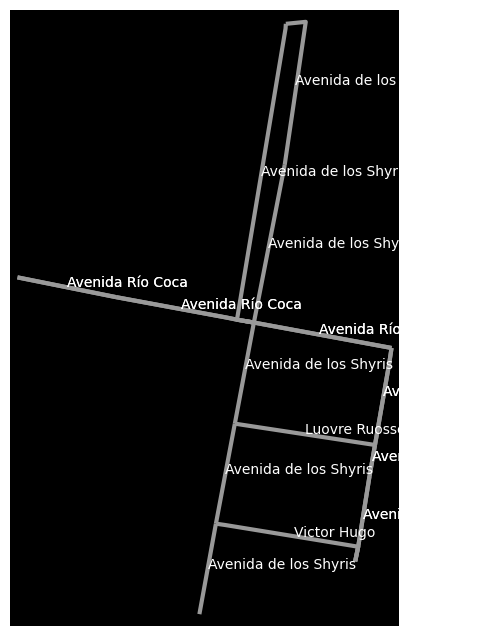

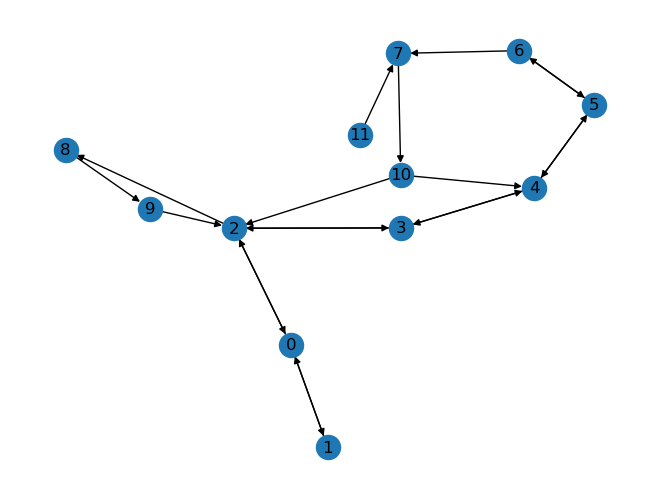

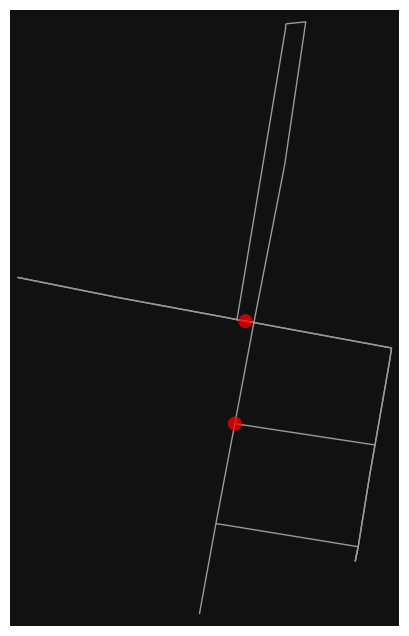

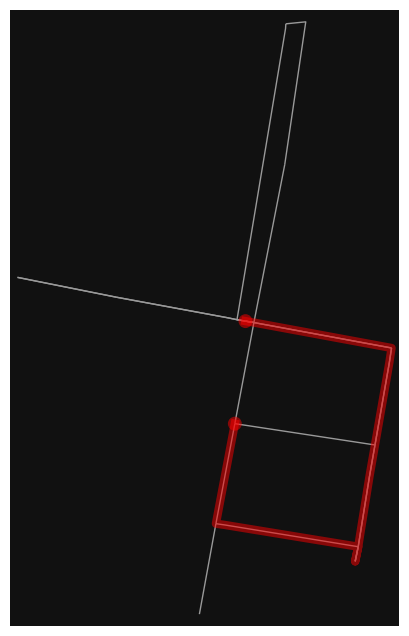

In [10]:
# Get the map 
G2 = get_node(-0.16279, -78.47848)

# plot the netwrok
nx.draw(G2, with_labels=True)

# Ploting just the nodes  
route0_G2 = nx.shortest_path(G2, 2, 2)
route1_G2 = nx.shortest_path(G2, 10, 10)
routes_G2 = [route0_G2 , route1_G2]

fig, ax = ox.plot_graph_routes(G2, routes_G2, route_linewidth=6, node_size=0)

# plot route from node 2 to node 10 
route00_G2 = nx.shortest_path(G2, 2, 10)

#Plot routes  
fig, ax = ox.plot_graph_route(G2, route00_G2, route_linewidth=6, node_size=0)

In [11]:
# def simulation function 

# first define the graph 
Graph = G2 

# get list of nodes 
list_nodes = list(G2.nodes)

# get dictionary with geocordinates of each of the nodes 

coordiantes = get_geo_coordinates( G2 )

# defining initial and final node
initial_node = list_nodes[2]
final_node = list_nodes[10]

# loop to finde the path: 

node_i = initial_node 

# to store the route:
route = {}

# all routes taken: 
all_routes = {}

while node_i != final_node:
    
    # measure the angle and distnac between the node_i and the destination node
    angle_i = get_angle( coordiantes[ node_i ], coordiantes[ final_node] )
    dist_i = get_distance( coordiantes[ node_i ], coordiantes[ final_node] ) 

    # get the neighbours of the node. The neighbours are directed nodes
    neighbors = list(G2.neighbors(node_i))

    # get probality of pick a given neighbour
    factors2 = {}

    for node in neighbors :

        # measure angle and dist of neighbors
        angle_neighbor = get_angle( coordiantes[ node ], coordiantes[ final_node] )
        dist_neighbor = get_distance( coordiantes[ node ], coordiantes[ final_node] )

        # calculate the probability of picking a node 
        factors2[node] = get_factor(dist_neighbor , angle_neighbor , dist_i , angle_i )

        print(dist_neighbor)

        # get probabilities
        proba_dic = get_probability(factors2)


    print("i am at node ", node_i, "and can go to ", proba_dic)
    
    all_routes[str(node_i)] = proba_dic

    # store route: 
    routes = list(route.keys())

    # check if working 
    for neighbor in neighbors:
        if neighbor in routes:
            del proba_dic[neighbor]
    
    # check dic
    print(proba_dic)
            
    # ge the node id 
    node_id = max(proba_dic , key= proba_dic.get)

    # add to route:
    route[node_id] = proba_dic

    # get the max probability    
    Proba = proba_dic[node_id]

    print("going to node " , node_id, "with proabaility " , Proba )

    # update position
    node_i = node_id

0.1121277534657611
0.17035084971475098
0.11248950910680075
i am at node  2 and can go to  {0: 0.40768160996767944, 8: 0.19480257033639745, 3: 0.3975158196959232}
{0: 0.40768160996767944, 8: 0.19480257033639745, 3: 0.3975158196959232}
going to node  0 with proabaility  0.40768160996767944
0.16935447222144015
0.06663173567933245
i am at node  0 and can go to  {1: 0.16626625868108463, 2: 0.8337337413189153}
{1: 0.16626625868108463, 2: 0.8337337413189153}
going to node  2 with proabaility  0.8337337413189153
0.1121277534657611
0.17035084971475098
0.11248950910680075
i am at node  2 and can go to  {0: 0.40768160996767944, 8: 0.19480257033639745, 3: 0.3975158196959232}
{8: 0.19480257033639745, 3: 0.3975158196959232}
going to node  3 with proabaility  0.3975158196959232
0.09163265370447932
0.06663173567933245
i am at node  3 and can go to  {4: 0.1961968741022779, 2: 0.8038031258977222}
{4: 0.1961968741022779}
going to node  4 with proabaility  0.1961968741022779
0.09342601066605756
0.11248950

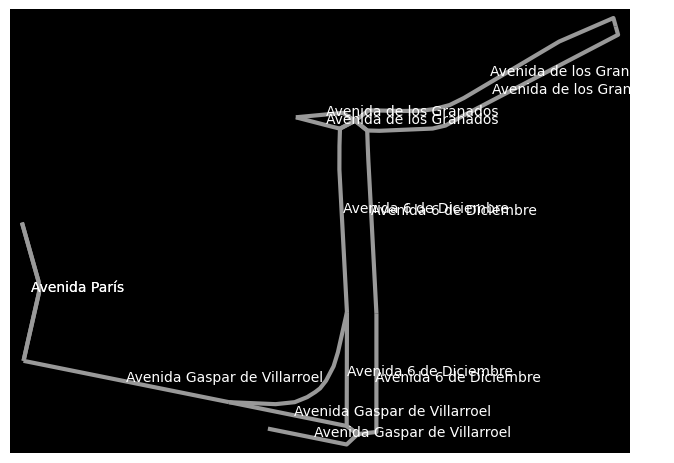

NodeNotFound: Either source 12 or target 12 is not in G

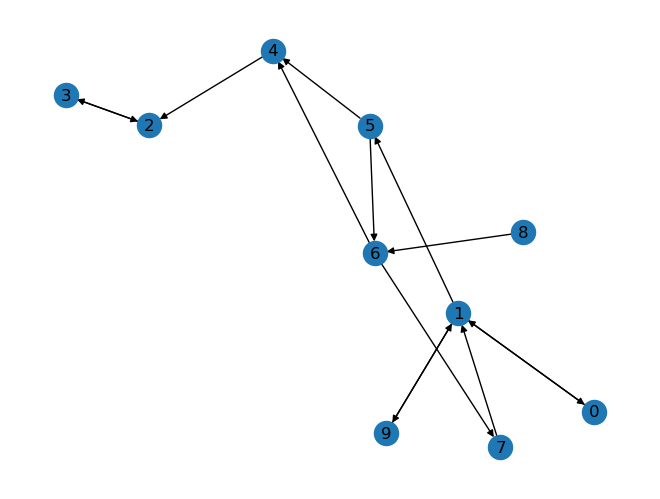

In [12]:
# Get the map 
G3 = get_node(-0.16916, -78.47632)

# plot the netwrok
nx.draw(G3, with_labels=True)

# Ploting just the nodes  
route0_G3 = nx.shortest_path(G3, 12, 12)
route1_G3 = nx.shortest_path(G3, 13, 13)
route2_G3 = nx.shortest_path(G3, 8, 8)
route3_G3 = nx.shortest_path(G3, 4, 4)
route4_G3 = nx.shortest_path(G3, 7, 7)
route5_G3 = nx.shortest_path(G3, 40, 40)
route6_G3 = nx.shortest_path(G3, 45, 45)
routes_G3 = [route0_G3 , route1_G3,route2_G3,route3_G3,route4_G3,route5_G3,route6_G3]

fig, ax = ox.plot_graph_routes(G3, routes_G3, route_linewidth=6, node_size=0)

# plot route from node 2 to node 10 
route00_G3 = nx.shortest_path(G3, 12, 54)

#Plot routes  
fig, ax = ox.plot_graph_route(G3, route00_G3, route_linewidth=6, node_size=0)

In [ ]:
# def simulation function 

# first define the graph 
Graph = G3 

# get list of nodes 
list_nodes = list(G3.nodes)

# get dictionary with geocordinates of each of the nodes 

coordiantes = get_geo_coordinates( G3 )

# defining initial and final node
initial_node = list_nodes[12]
final_node = list_nodes[54]

# loop to finde the path: 

node_i = initial_node 

# to store the route:
route = {}

# all routes taken: 
all_routes = {}

while node_i != final_node:
    
    # measure the angle and distnac between the node_i and the destination node
    angle_i = get_angle( coordiantes[ node_i ], coordiantes[ final_node] )
    dist_i = get_distance( coordiantes[ node_i ], coordiantes[ final_node] ) 

    # get the neighbours of the node. The neighbours are directed nodes
    neighbors = list(G3.neighbors(node_i))

    # get probality of pick a given neighbour
    factors2 = {}

    for node in neighbors :

        # measure angle and dist of neighbors
        angle_neighbor = get_angle( coordiantes[ node ], coordiantes[ final_node] )
        dist_neighbor = get_distance( coordiantes[ node ], coordiantes[ final_node] )

        # calculate the probability of picking a node 
        factors2[node] = get_factor(dist_neighbor , angle_neighbor , dist_i , angle_i )

        # get probabilities
        proba_dic = get_probability(factors2)


    print("i am at node ", node_i, "and can go to ", proba_dic)
    
    all_routes[str(node_i)] = proba_dic

    # store route: 
    routes = list(route.keys())

    # check if working 
    for neighbor in neighbors:
        if neighbor in routes:
            proba_dic[neighbor]= proba_dic[neighbor]*0.2
    
    # check dic
    print(proba_dic)
            
    # ge the node id 
    node_id = max(proba_dic , key= proba_dic.get)

    # add to route:
    route[node_id] = proba_dic

    # get the max probability    
    Proba = proba_dic[node_id]

    print("going to node " , node_id, "with proabaility " , Proba )

    # update position
    node_i = node_id

i am at node  12 and can go to  {10: 0.40328915852192304, 13: 0.596710841478077}
{10: 0.40328915852192304, 13: 0.596710841478077}
going to node  13 with proabaility  0.596710841478077
i am at node  13 and can go to  {12: 0.25427774021906885, 8: 0.4989138674221554, 11: 0.24680839235877572}
{12: 0.25427774021906885, 8: 0.4989138674221554, 11: 0.24680839235877572}
going to node  8 with proabaility  0.4989138674221554
i am at node  8 and can go to  {15: 0.14880133441913407, 16: 0.2131616639474168, 13: 0.19134461889105314, 4: 0.4466923827423959}
{15: 0.14880133441913407, 16: 0.2131616639474168, 13: 0.03826892377821063, 4: 0.4466923827423959}
going to node  4 with proabaility  0.4466923827423959
i am at node  4 and can go to  {7: 0.3838200209305383, 8: 0.13153913529748784, 41: 0.34745531007151215, 3: 0.1371855337004617}
{7: 0.3838200209305383, 8: 0.02630782705949757, 41: 0.34745531007151215, 3: 0.1371855337004617}
going to node  7 with proabaility  0.3838200209305383
i am at node  7 and can 

KeyboardInterrupt: 

In [3]:
import numpy as np
(15.59)/(360)

0.043305555555555555

In [2]:
2*np.pi

6.283185307179586